In [1]:
# !pip install tensorflow
# !pip install keras
# !pip install opencv-python 
# !pip install tqdm
# !pip install matplotlib
# !pip install tensorflow_addons
# !pip install tensorflow_datasets

In [2]:
from instancenorm import InstanceNormalization
import tensorflow as tf
# Common
import os
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, losses, datasets
import cv2
import time
# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
gpus = tf.config.list_physical_devices('GPU')
print(gpus)
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
    

ImportError: 

IMPORTANT: PLEASE READ THIS FOR ADVICE ON HOW TO SOLVE THIS ISSUE!

Importing the numpy C-extensions failed. This error can happen for
many reasons, often due to issues with your setup or how NumPy was
installed.

We have compiled some common reasons and troubleshooting tips at:

    https://numpy.org/devdocs/user/troubleshooting-importerror.html

Please note and check the following:

  * The Python version is: Python3.10 from "c:\Users\finla\anaconda3\envs\py310\python.exe"
  * The NumPy version is: "1.23.0"

and make sure that they are the versions you expect.
Please carefully study the documentation linked above for further help.

Original error was: DLL load failed while importing _multiarray_umath: The specified module could not be found.


ImportError: 

IMPORTANT: PLEASE READ THIS FOR ADVICE ON HOW TO SOLVE THIS ISSUE!

Importing the numpy C-extensions failed. This error can happen for
many reasons, often due to issues with your setup or how NumPy was
installed.

We have compiled some common reasons and troubleshooting tips at:

    https://numpy.org/devdocs/user/troubleshooting-importerror.html

Please note and check the following:

  * The Python version is: Python3.10 from "c:\Users\finla\anaconda3\envs\py310\python.exe"
  * The NumPy version is: "1.23.0"

and make sure that they are the versions you expect.
Please carefully study the documentation linked above for further help.

Original error was: DLL load failed while importing _multiarray_umath: The specified module could not be found.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
#Models
class ResidualBlock(tf.keras.Model):
    def __init__(self, filters):
        super(ResidualBlock, self).__init__()
        self.conv1 = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same')
        self.bn1 = layers.BatchNormalization()
        self.relu = layers.ReLU()
        self.conv2 = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same')
        self.bn2 = layers.BatchNormalization()

    def call(self, x, training=False):
        residual = x
        x = self.conv1(x)
        x = self.bn1(x, training=training)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        x += residual
        x = self.relu(x)
        return x
    
def make_generator_model():
    model = tf.keras.Sequential()
    # Encoder
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)))
    model.add(InstanceNormalization(axis=-1))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(InstanceNormalization(axis=-1))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(InstanceNormalization(axis=-1))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(InstanceNormalization(axis=-1))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    
    for _ in range(9):
        model.add(ResidualBlock(256))
        
    # Decoder
    model.add(tf.keras.layers.Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(InstanceNormalization(axis=-1))

    model.add(tf.keras.layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(InstanceNormalization(axis=-1))

    model.add(tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(InstanceNormalization(axis=-1))

    model.add(tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(InstanceNormalization(axis=-1))

    model.add(tf.keras.layers.Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same', activation='tanh'))
    return model


def build_discriminator():
    inputs = tf.keras.Input(shape=(256, 256, 3))

    x = layers.Conv2D(64, kernel_size=4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, kernel_size=4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, kernel_size=4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    outputs = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(x)

    model = models.Model(inputs, outputs)
    return model

#losses
def cycle_loss(real_image, cycled_image):
    return tf.reduce_mean(tf.abs(real_image - cycled_image))

def identity_loss(real_image, same_image):
    return tf.reduce_mean(tf.abs(real_image - same_image))

def generator_loss(disc_generated_output):
    return tf.reduce_mean(tf.losses.binary_crossentropy(tf.ones_like(disc_generated_output), disc_generated_output, from_logits=True))

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = tf.reduce_mean(tf.losses.binary_crossentropy(tf.ones_like(disc_real_output), disc_real_output, from_logits=True))
    generated_loss = tf.reduce_mean(tf.losses.binary_crossentropy(tf.zeros_like(disc_generated_output), disc_generated_output, from_logits=True))
    return real_loss + generated_loss


In [4]:

def load_images(path):
    images = []
    for filename in os.listdir(path):
        img = cv2.imread(os.path.join(path,filename))
        if img is not None:
            img = cv2.resize(img, (256,256)) # resize the image again to the desired size
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = (img.astype('float32') - 127.5)/127.5# normalize pixel values
            images.append(img)
    images = np.array(images)
    return images

def truncate_datasets(dataset_x, dataset_y):
    # Truncate datasets to the same length
    min_size = min(len(dataset_x), len(dataset_y))
    return dataset_x[:min_size], dataset_y[:min_size]

def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [5]:
real_images = 'img_align_celeba'
anime_images = 'Hayao\style'
real_images = load_images(real_images)

anime_images = load_images(anime_images)

real_images , anime_images = truncate_datasets(real_images , anime_images)
real_images[0].shape

sample_real = next(iter(real_images))
sample_anime = next(iter(anime_images))

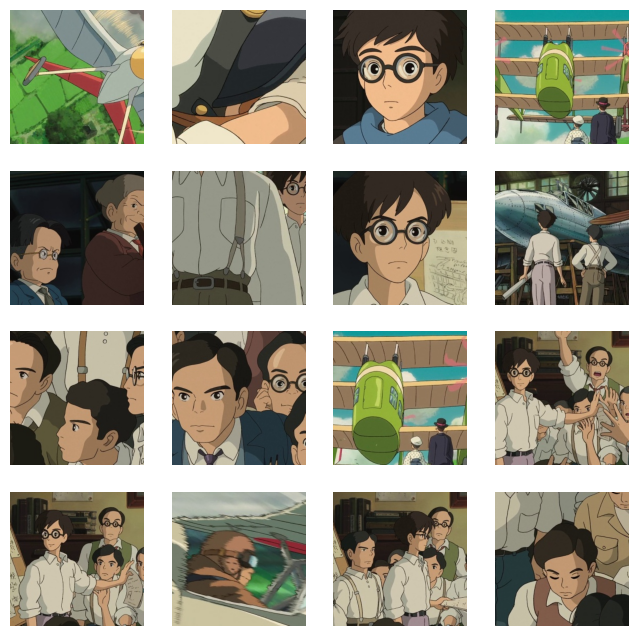

In [6]:
fig,axs = plt.subplots(nrows=4,ncols=4,figsize=(8,8))
for i in range(16):
    ax = axs[i//4,i%4]
    sample = anime_images[i]
    sample = (((sample * 127.5) + 127.5)).astype(np.uint8)
    ax.imshow((sample))
    ax.axis('off')
plt.show()

In [7]:
generator_g = make_generator_model()
generator_f = make_generator_model()
discriminator_x = build_discriminator()
discriminator_y = build_discriminator()

generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

EPOCHS = 200

@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    # same_x = generator_f(real_x, training=True)
    # same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss #+ identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss #+ identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

In [8]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

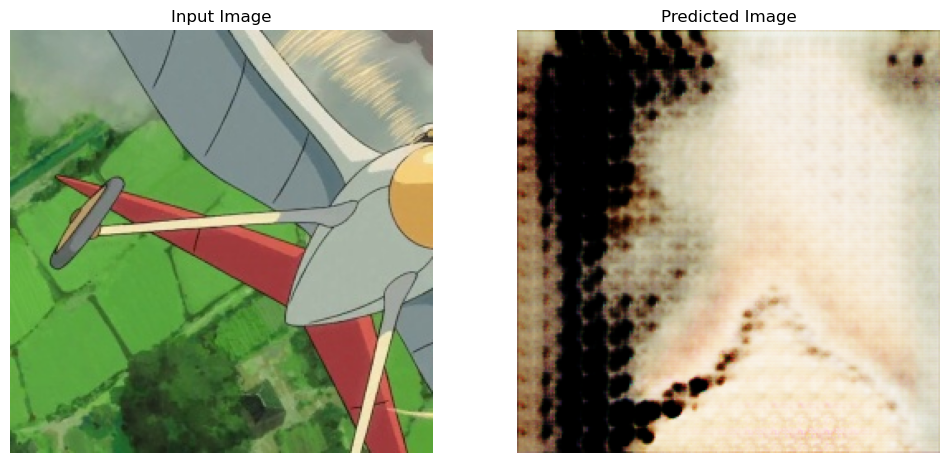

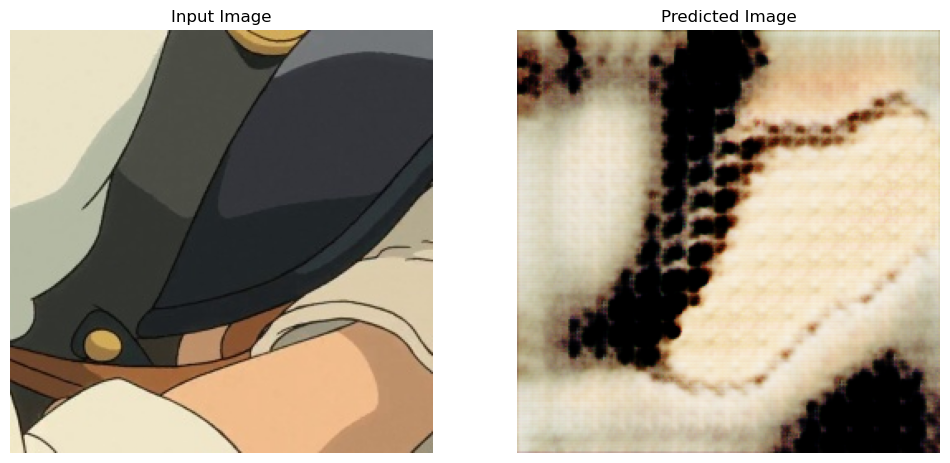

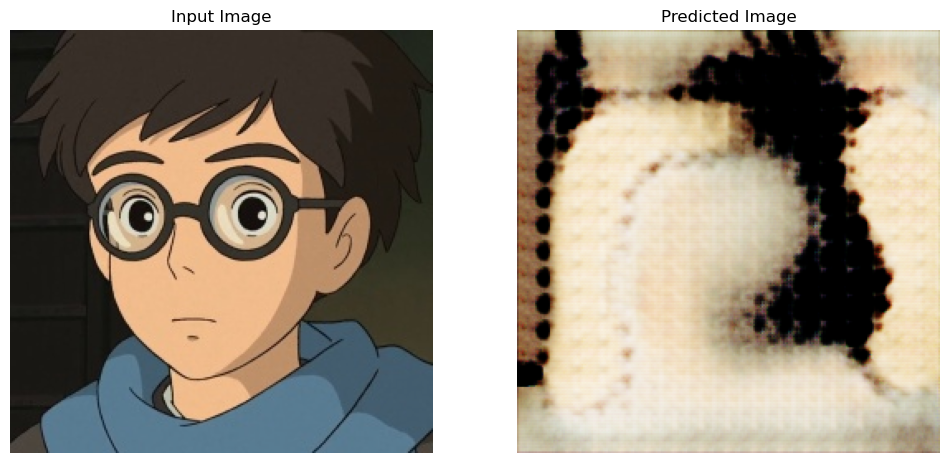

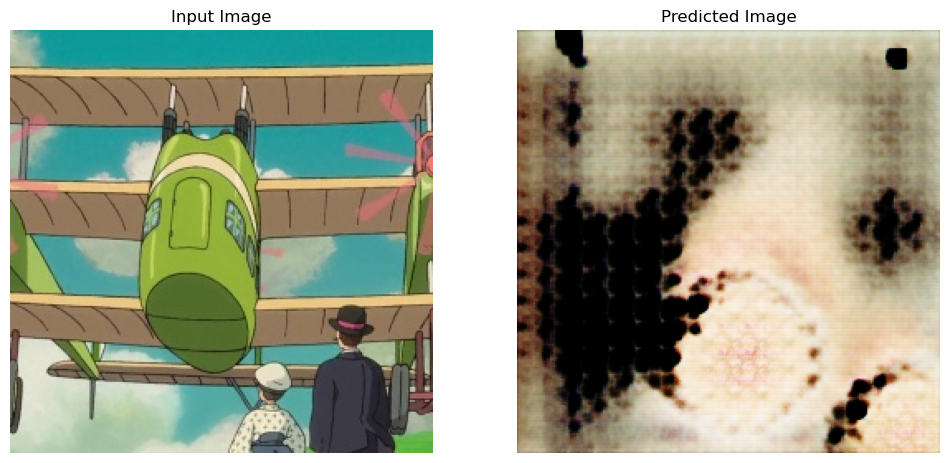

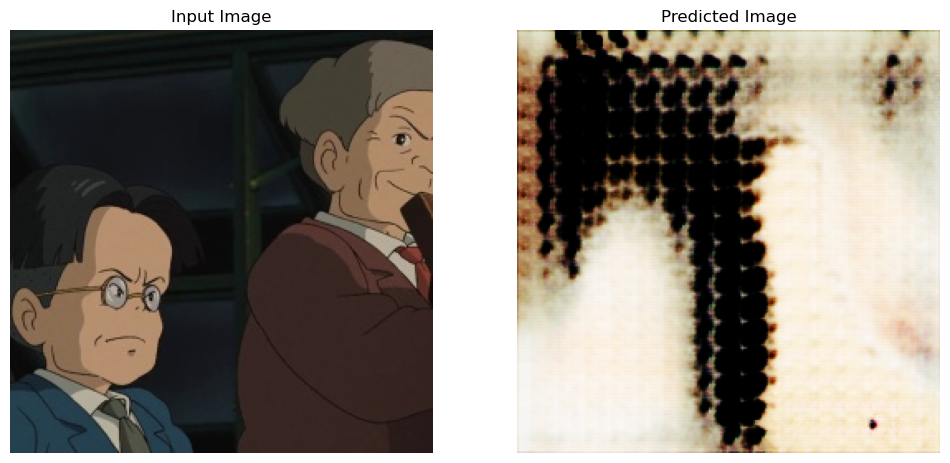

...

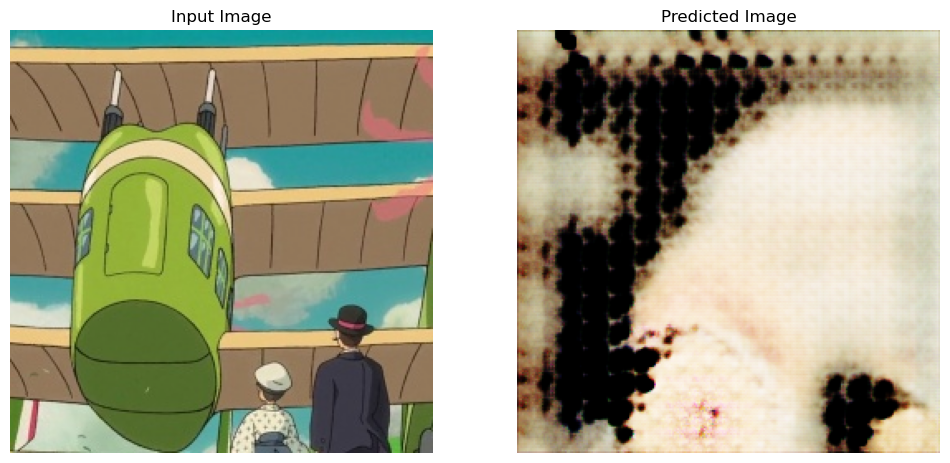

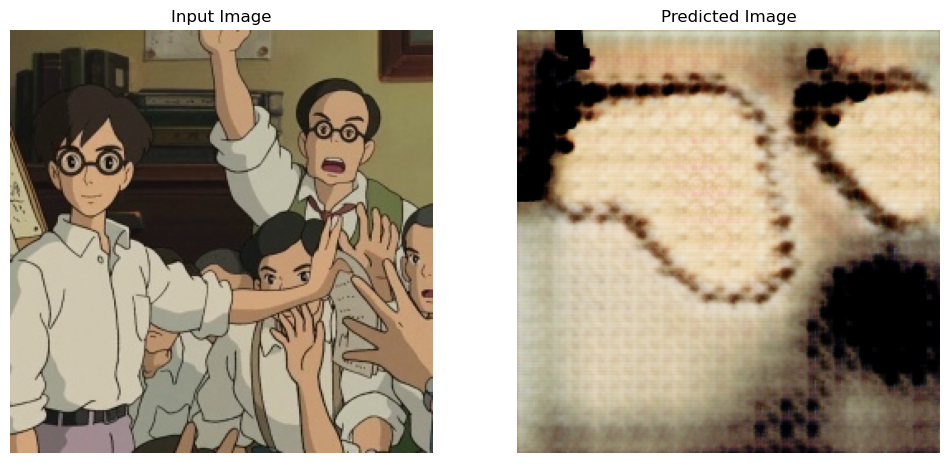

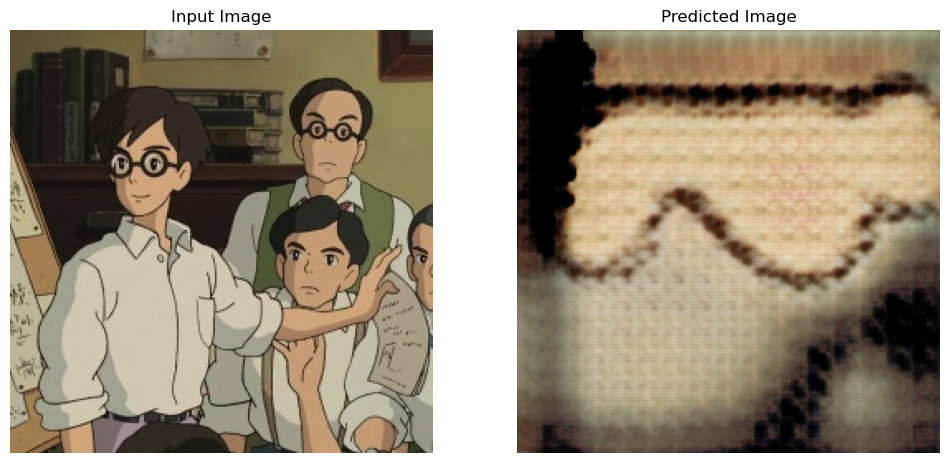

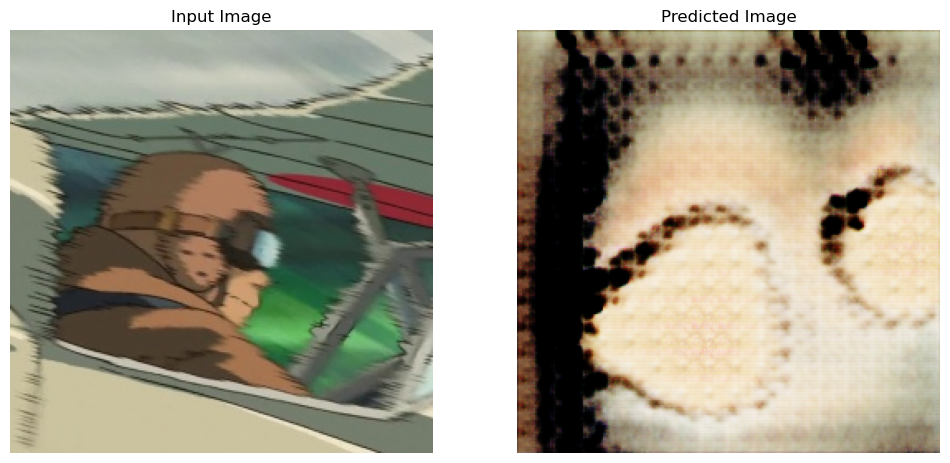

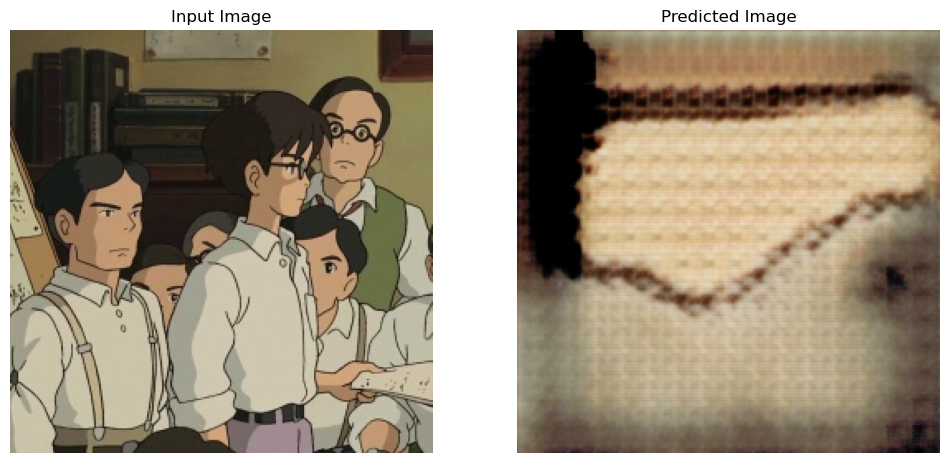

Saving checkpoint for epoch 3 at ./checkpoints/train\ckpt-3
Time taken for epoch 3 is 231.18650269508362 sec



 17%|█▋        | 298/1752 [00:38<03:03,  7.93it/s]

In [9]:
from IPython.display import clear_output

for epoch in range(EPOCHS):
  start = time.time()
  BATCH_SIZE=1 #According to all papers batch size must be 1 still defined it to maintain 4 dims when passed to model
  n = 0
  for i in tqdm(range(0, len(real_images), BATCH_SIZE)):
    image_x = anime_images[i:i+BATCH_SIZE]
    image_y = real_images[i:i+BATCH_SIZE]

    train_step(image_x, image_y)

  clear_output(wait=True)
  # Using a consistent image so that the progress of the model
  # is clearly visible.
  for x in range(len(anime_images[:15])):
    image_x = anime_images[x:x+BATCH_SIZE]
    generate_images(generator_g, image_x)

  if (epoch + 1) % 1 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                          ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


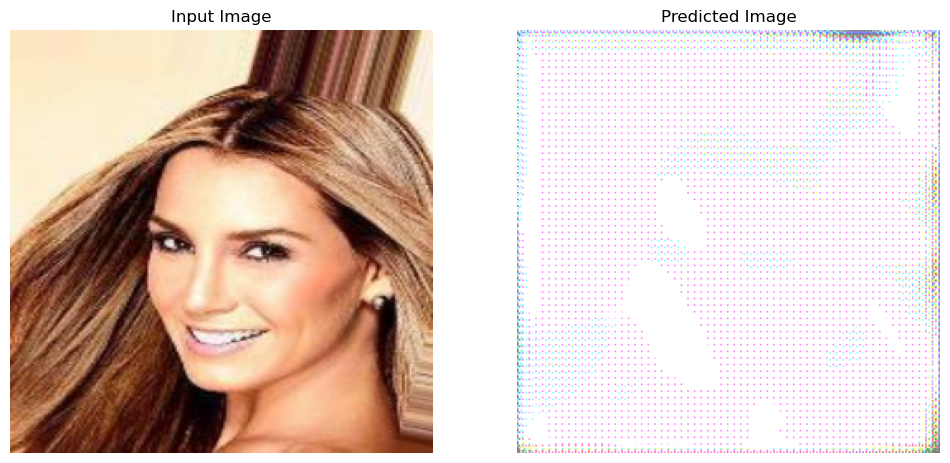

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


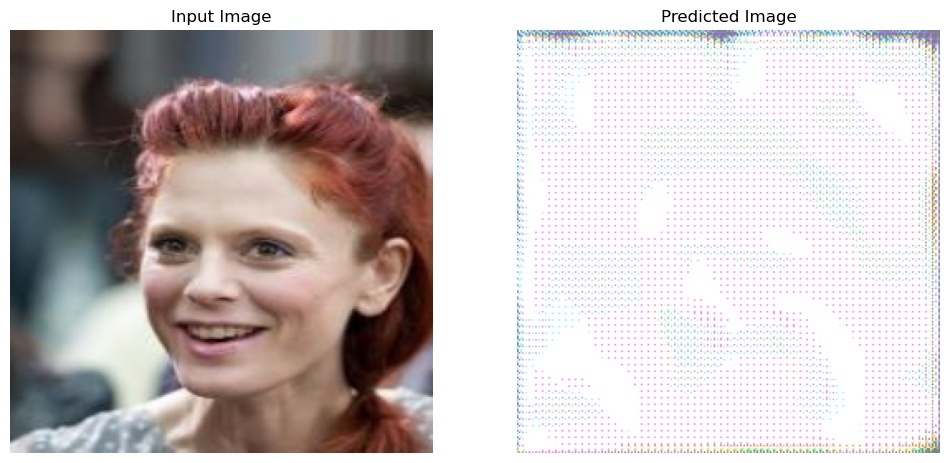

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


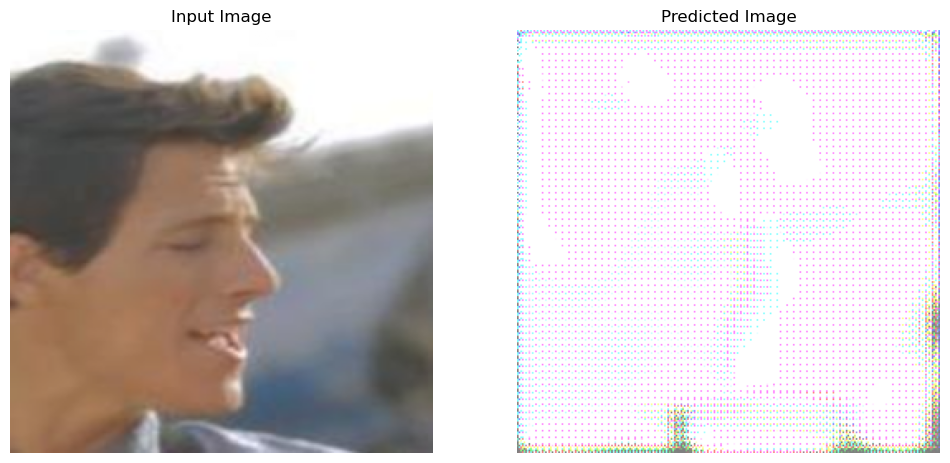

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


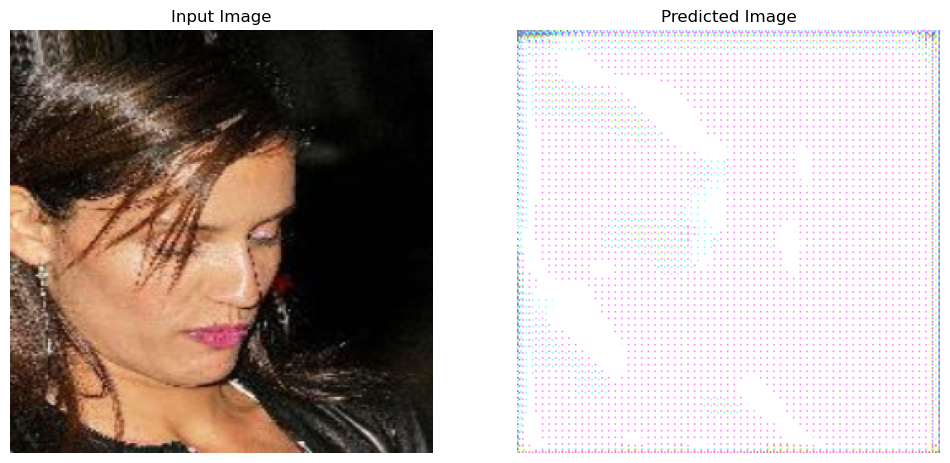

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


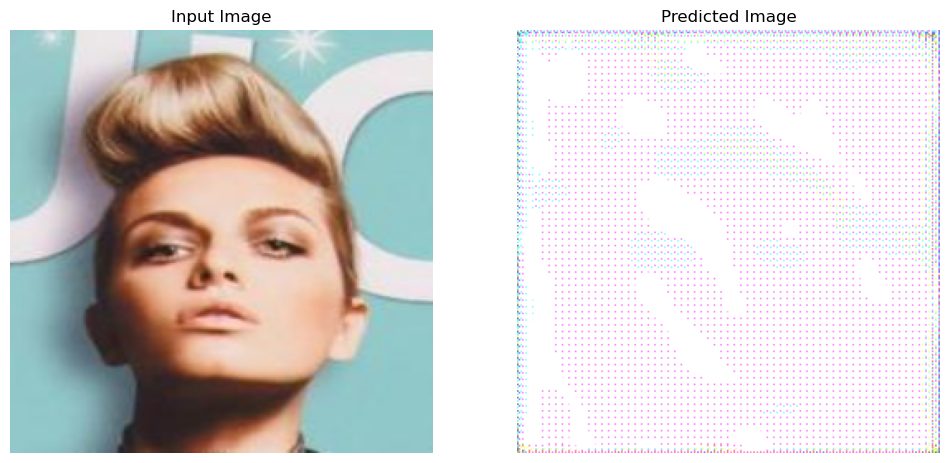

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


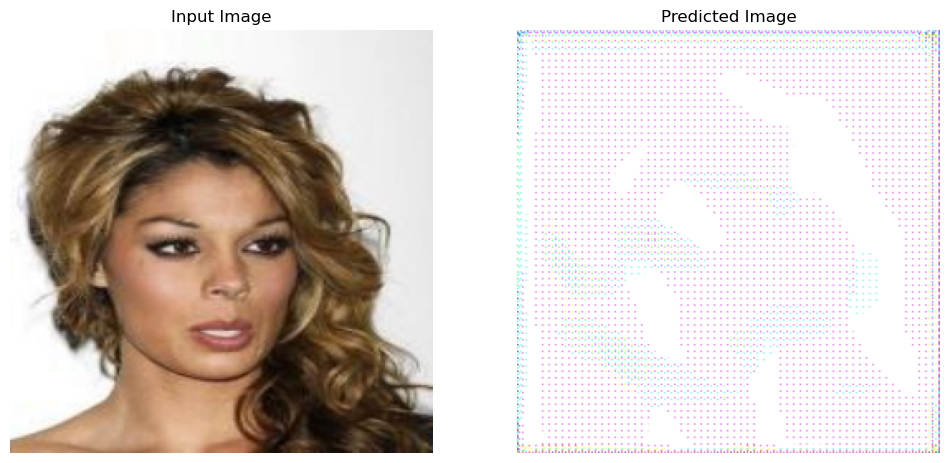

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


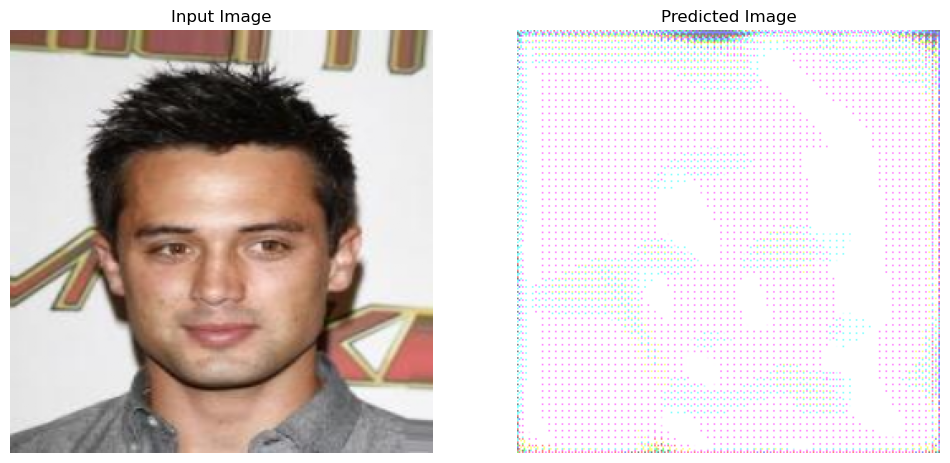

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


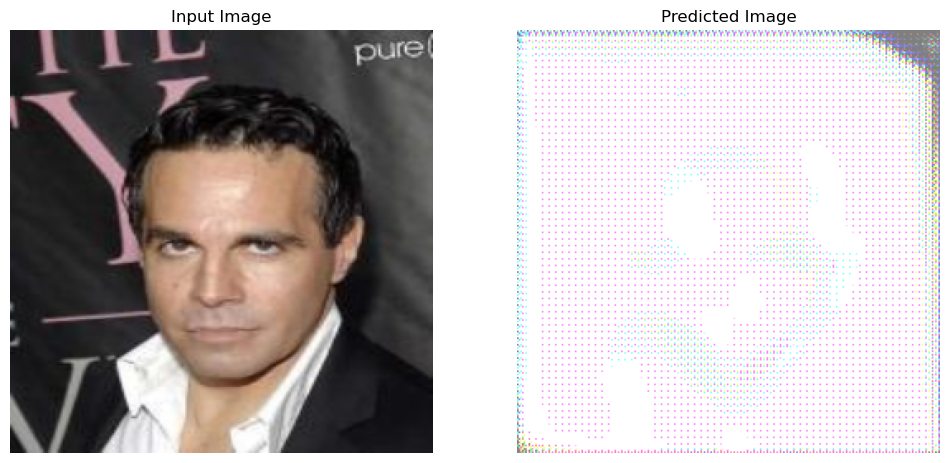

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


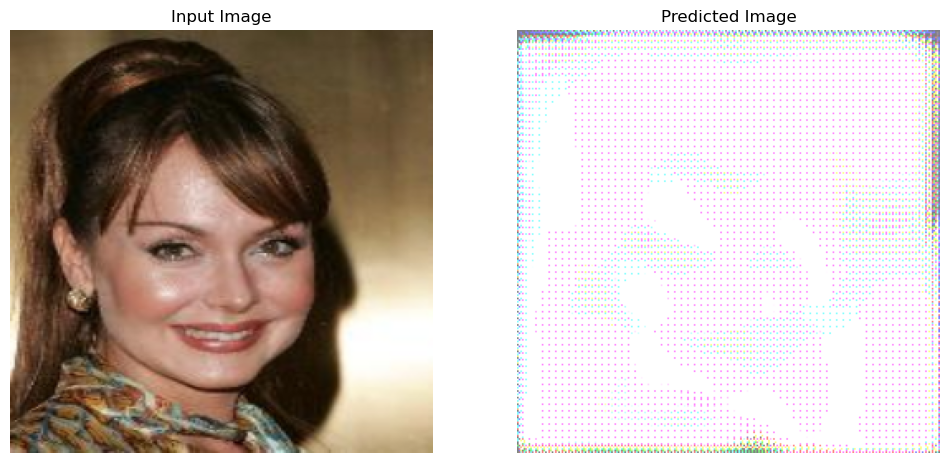

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


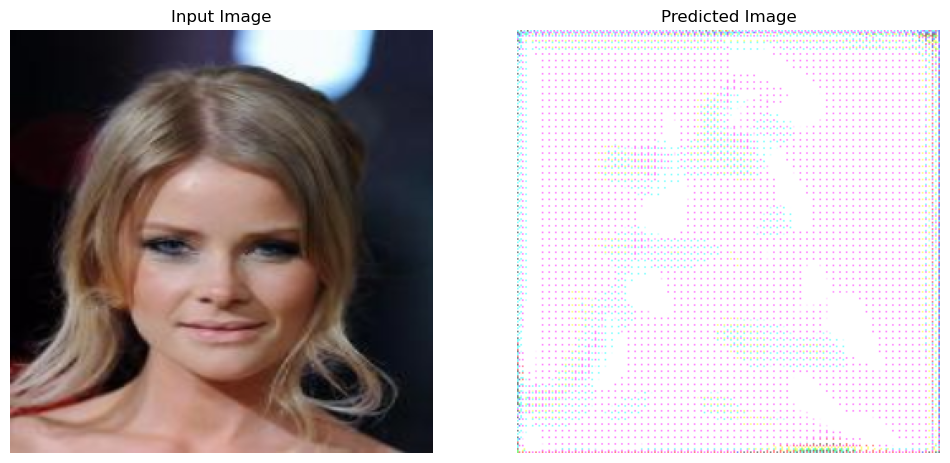

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


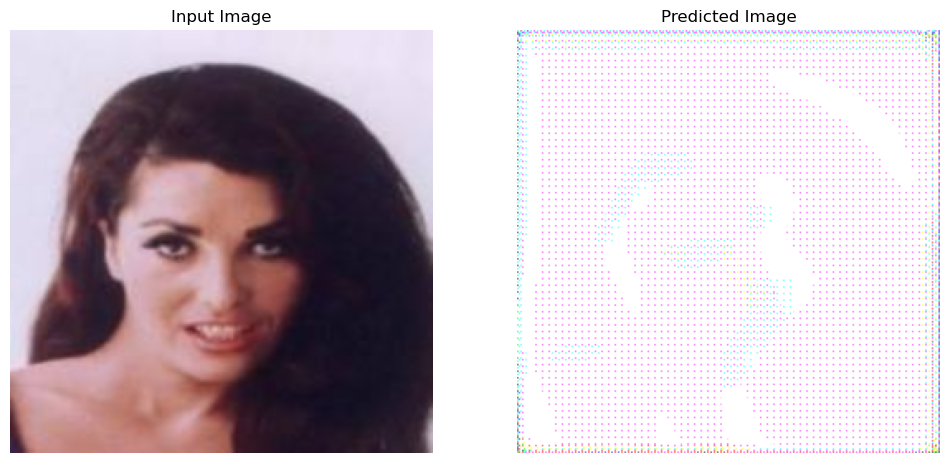

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


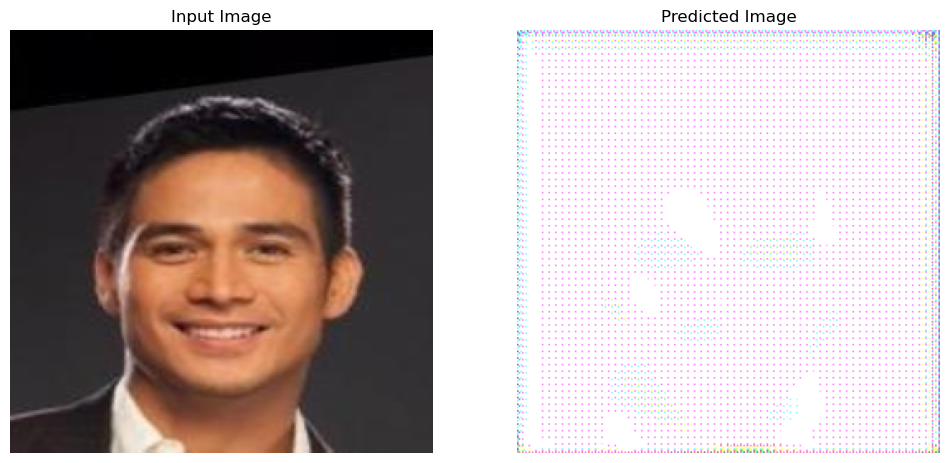

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


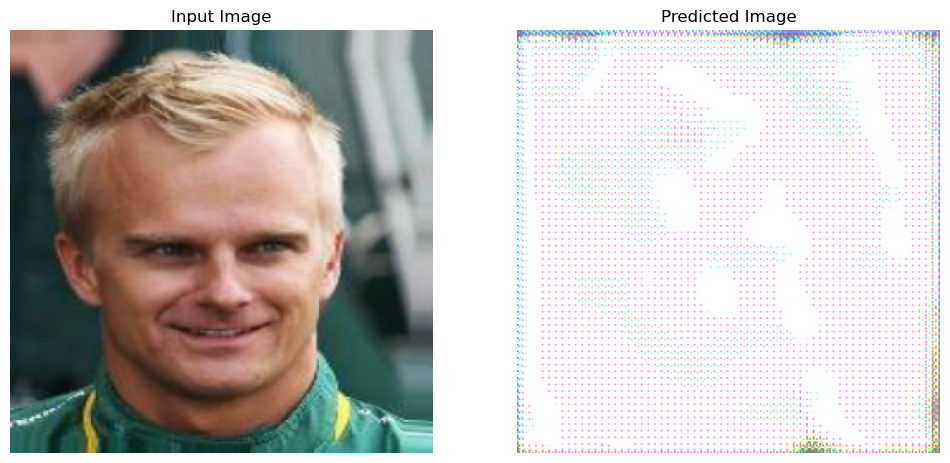

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


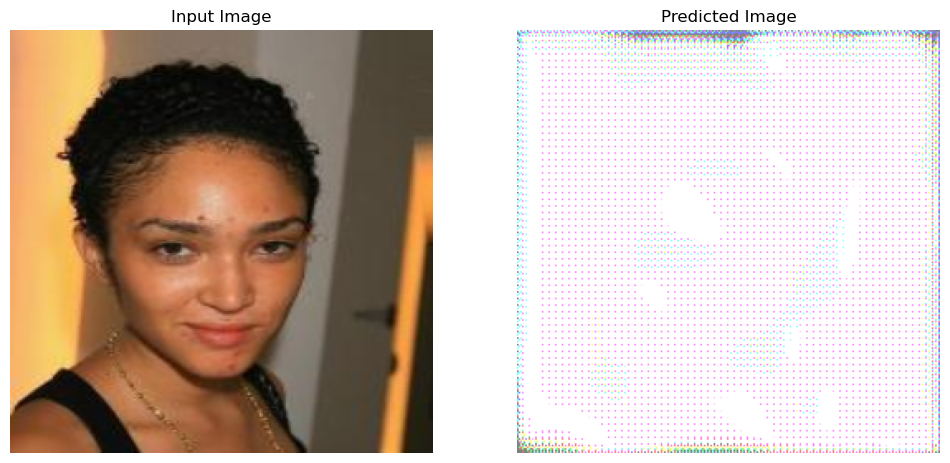

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


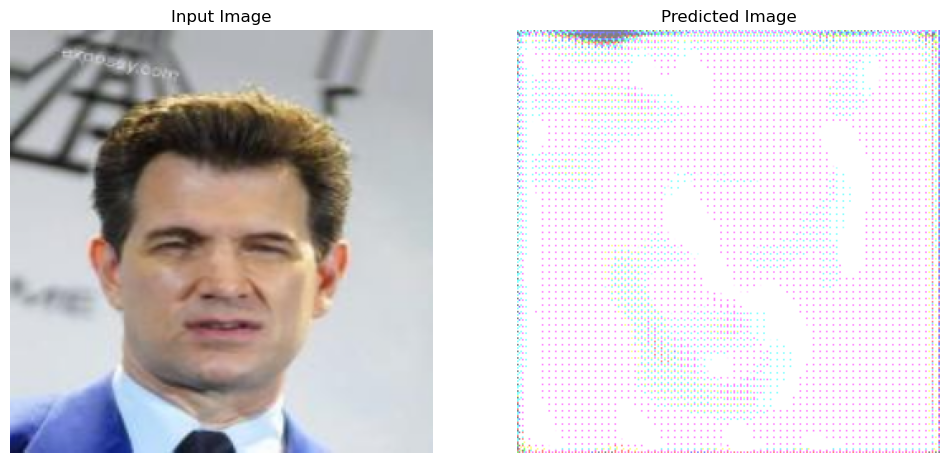

In [ ]:
for x in range(len(anime_images[:15])):
  image_x = real_images[x:x+BATCH_SIZE]
  generate_images(generator_g, image_x)